In [1]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import community.community_louvain as community_louvain

import networkx as nx
from networkx.algorithms import bipartite
from networkx.algorithms.community.centrality import girvan_newman

from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [2]:
# read the data
df = pd.read_csv('CalCareersData.csv')
df

,Job_Listing,Working_Title,Job Control,Salary_Range,Work_Type/Schedule,Department,Location,Publish_Date,Filing_Deadline,URLs
0,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...,CORRECTIONAL SUPERVISING COOK (CF) - PIP - CAL...,395890,$2397.60 - $2949.60,Permanent Part-time,California Correctional Health Care Services,Solano County,9/30/2023,10/14/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
1,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,395891,$2786.00 - $3162.00,Non-Tenured Intermittent,California Rehabilitation Center,Riverside County,9/30/2023,10/13/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
2,ACCOUNTANT I (SPECIALIST),Account I (Specialist),395635,$3600.00 - $4506.00,Permanent Fulltime,CDCR - San Quentin State Prison,Marin County,9/29/2023,10/13/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
3,ACCOUNTING ADMINISTRATOR I (SUPERVISOR),"Accounting Administrator I, Supervisor",395694,$6653.00 - $8153.00,Permanent Fulltime,Department of Forestry & Fire Protection,Yolo County,9/29/2023,10/9/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
4,ACCOUNTING OFFICER (SPECIALIST),Telework Option- Accounting Officer (Specialis...,395775,$4819.00 - $6032.00,Permanent Fulltime,Department of Industrial Relations,San Francisco County,9/29/2023,10/13/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
...,...,...,...,...,...,...,...,...,...,...
5761,ATTORNEY III,VSP Attorney III,379709,$10229.00 - $13132.00,Permanent Fulltime,Department of Toxic Substances Control,United States,7/3/2023,Until Filled,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
5762,CERTIFIED NURSING ASSISTANT,CERTIFIED NURSING ASSISTANT,380676,$2786.00 - $3745.00,Permanent Fulltime,Department of Veterans Affairs,San Diego County,7/3/2023,Until Filled,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
5763,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK...",DISTRICT SUPERINTENDENT,357701,$11887.00 - $14852.00,Permanent Fulltime,Department of Parks & Recreation,Santa Clara County,7/3/2023,9/30/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...
5764,INFORMATION OFFICER II,Public Information Officer,371387,$6862.00 - $8527.00,Permanent Fulltime,Department of Consumer Affairs,Sacramento County,7/3/2023,8/30/2023,https://www.calcareers.ca.gov/CalHrPublic/Jobs...


In [3]:
df = df[['Location', 'Job_Listing']]
df = df.dropna()
df = df.drop_duplicates()
df.to_csv(r'CalCareersData_dropna.csv', index=False)
df

,Location,Job_Listing
0,Solano County,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...
1,Riverside County,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE
2,Marin County,ACCOUNTANT I (SPECIALIST)
3,Yolo County,ACCOUNTING ADMINISTRATOR I (SUPERVISOR)
4,San Francisco County,ACCOUNTING OFFICER (SPECIALIST)
...,...,...
5752,Lassen County,AGRICULTURAL TECHNICIAN I (SEASONAL)
5754,El Dorado County,AGRICULTURAL TECHNICIAN I (SEASONAL)
5756,Del Norte County,AGRICULTURAL TECHNICIAN I (SEASONAL)
5763,Santa Clara County,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK..."


In [4]:
Location_name = df['Location']
Job_Listing_title = df['Job_Listing']
print("Số location: ",Location_name.nunique())
print("số Job Listing: ",Job_Listing_title.nunique())
print("Số cạnh: ",len(df))

Số location:  58
số Job Listing:  778
Số cạnh:  2378


In [5]:
B = nx.Graph()
for index, row in df.iterrows():
    B.add_edge(row['Location'], row['Job_Listing'], weight=1)
B.add_nodes_from(Location_name, bipartite=0)
B.add_nodes_from(Job_Listing_title, bipartite=1)

In [6]:
# In ra tổng số cạnh của đồ thị
total_edges = B.size()
print(f"Tổng số cạnh của đồ thị 2 phía là: {total_edges}")

Tổng số cạnh của đồ thị 2 phía là: 2378


# Đồ thị 2 phía

<Figure size 2000x2000 with 0 Axes>

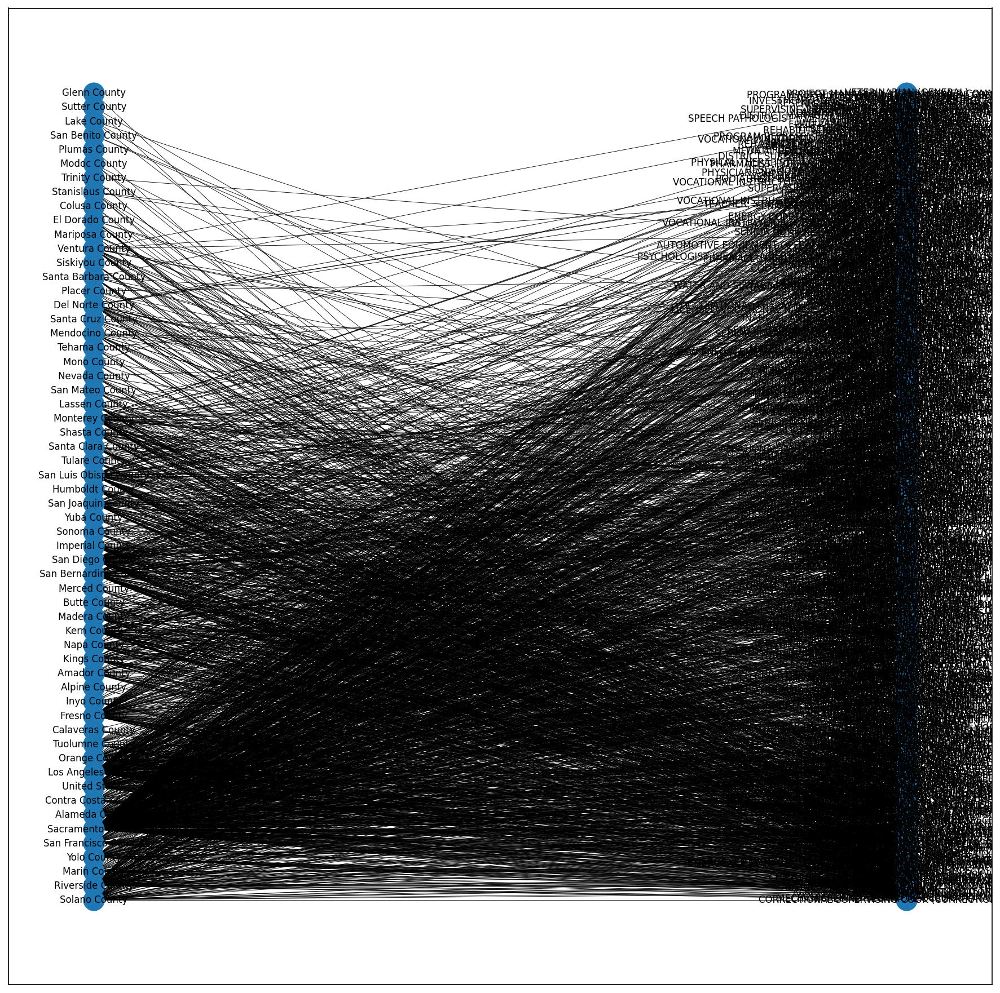

In [7]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,20))
pos = nx.spring_layout(B)
fig, ax = plt.subplots(1,1, figsize=(15,15), dpi=150)
nx.draw_networkx(B, pos = nx.drawing.layout.bipartite_layout(B,Location_name), font_size=8, width=0.4)

# Đồ thị 1 phía

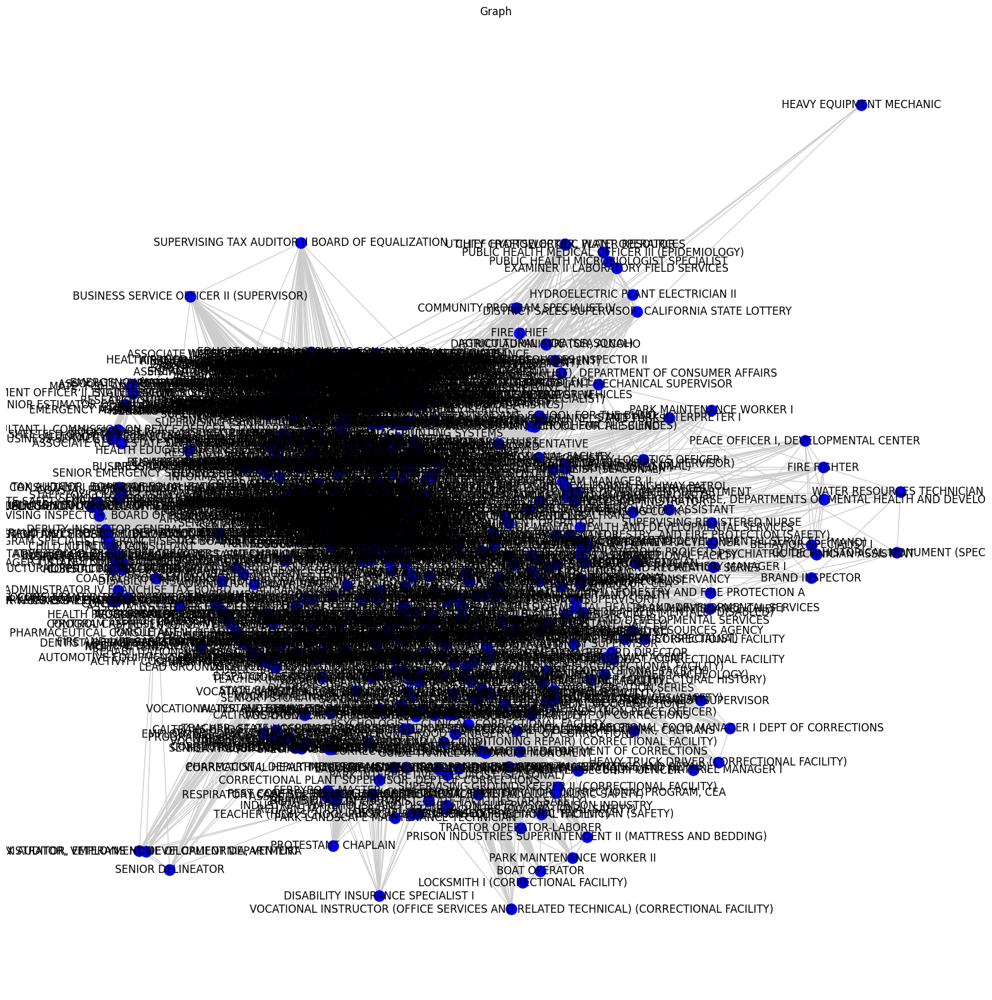

In [8]:
Location_name = df['Location'].unique()
Job_Listing_title = df['Job_Listing'].unique()
G = bipartite.weighted_projected_graph(B, Job_Listing_title)

plt.figure(figsize=(20,20))
layout = nx.spring_layout(G)

nx.draw_networkx_nodes(G,
                       layout,
                       nodelist=Job_Listing_title,
                       node_size=150,
                       node_color='blue')

nx.draw_networkx_edges(G,layout,edge_color="#cccccc")
node_labels = dict(zip(Job_Listing_title, Job_Listing_title))
nx.draw_networkx_labels(G, layout, labels=node_labels)

plt.axis('off')
plt.title('Graph')
plt.show()

In [9]:
# In ra số đỉnh của đồ thị 1 phía
total_nodes = G.number_of_nodes()
print(f"Số đỉnh của đồ thị 1 phía là: {total_nodes}")
# In ra số cạnh của đồ thị 1 phía
num_edges = G.number_of_edges()
print(f"Số cạnh của đồ thị 1 phía là: {num_edges}")

Số đỉnh của đồ thị 1 phía là: 778
Số cạnh của đồ thị 1 phía là: 116993


# Lấy Random 10 đỉnh

In [75]:
import random
node_list = list(G.nodes)
node = random.sample(node_list, 10)
node

['CALTRANS HIGHWAY MAINTENANCE WORKER',
 'LEAD GROUNDSKEEPER',
 'Communications Editor',
 'SUPERVISING ENGINEER WATER RESOURCES',
 'MUSLIM CHAPLAIN',
 'EMPLOYMENT PROGRAM MANAGER II',
 'TEACHER (HIGH SCHOOL-GENERAL EDUCATION) (CORRECTIONAL FACILITY)',
 'EXECUTIVE ASSISTANT',
 'PROGRAM MANAGER II, CALIFORNIA BAY DELTA AUTHORITY',
 'SENIOR TRANSPORTATION ELECTRICAL ENGINEER (SUPERVISOR)']

{}

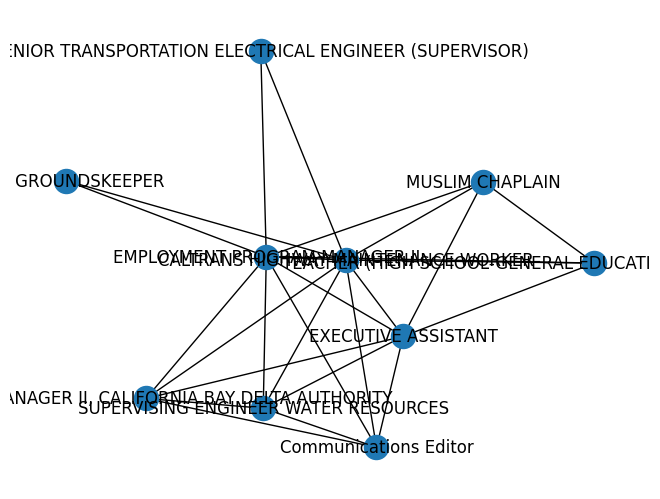

In [76]:
k1 = G.subgraph(node)
pos = nx.spring_layout(k1)
nx.draw(k1, pos, with_labels=True)
labels = nx.get_edge_attributes(k1, 'degree')
nx.draw_networkx_edge_labels(k1, pos, edge_labels=labels)

In [78]:
labels = nx.get_edge_attributes(k1,'weight')

df_10_nodes = pd.DataFrame(columns=['source', 'target', 'weight'])

for key, value in labels.items():
    df_10_nodes = pd.concat([df_10_nodes, pd.DataFrame({'source': [key[0]], 'target': [key[1]], 'weight': [value]})], ignore_index=True)
df_10_nodes.to_csv(r'10nodes.csv', index = False, header = True)
df_10_nodes.to_excel(r'10nodes.xlsx', index = False, header = True)

In [10]:
import pandas as pd
import networkx as nx

label_full_nodes = nx.get_edge_attributes(G, 'weight')
df_full_nodes = pd.DataFrame(columns=['source', 'target', 'weight'])

for key, value in label_full_nodes.items():
    df_full_nodes = pd.concat([df_full_nodes, pd.DataFrame({'source': [key[0]], 'target': [key[1]], 'weight': [value]})], ignore_index=True)

df_full_nodes.to_csv(r'full_nodes_job.csv', index=False, header=True)

# MEASURE

In [11]:
# Độ đo Closeness centrality
closeness_centrality = nx.closeness_centrality(G)
for node in sorted(closeness_centrality, key=closeness_centrality.get, reverse=True):
  print(node, closeness_centrality[node])

ASSOCIATE GOVERNMENTAL PROGRAM ANALYST 0.9664179104477612
ENVIRONMENTAL SCIENTIST 0.9327731092436975
OFFICE TECHNICIAN (TYPING) 0.9261025029797377
CLINICAL SOCIAL WORKER (HEALTH/CORRECTIONAL FACILITY) - SAFETY 0.9239001189060642
HEALTH FACILITIES EVALUATOR NURSE 0.9098360655737705
STAFF SERVICES MANAGER I 0.8993055555555556
CUSTODIAN I 0.8910550458715596
STAFF SERVICES ANALYST 0.8890160183066361
CALTRANS EQUIPMENT OPERATOR II 0.8849658314350797
HEALTH PROGRAM SPECIALIST I 0.8799546998867497
CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY) 0.8759864712514093
GRADUATE STUDENT ASSISTANT 0.8759864712514093
REGISTERED NURSE, CORRECTIONAL FACILITY 0.8759864712514093
CALTRANS HIGHWAY MAINTENANCE WORKER 0.875
STAFF PSYCHIATRIST, CORRECTIONAL AND REHAB SERVICES (SAFETY) 0.875
LICENSED VOCATIONAL NURSE, CALIFORNIA DEPARTMENT OF CORRECTIONS AND REHABILITATION 0.8730337078651685
PSYCHIATRIC TECHNICIAN (SAFETY) 0.8710762331838565
PHYSICIAN AND SURGEON, CORRECTIONAL FACILITY (INTERNAL MED/FAMIL

In [12]:
# Độ đo Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)
for node in sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True):
  print(node, betweenness_centrality[node])

ASSOCIATE GOVERNMENTAL PROGRAM ANALYST 0.01567828522548768
OFFICE TECHNICIAN (TYPING) 0.012529004487789468
ENVIRONMENTAL SCIENTIST 0.012229515185812816
CALTRANS EQUIPMENT OPERATOR II 0.011814812653488636
CLINICAL SOCIAL WORKER (HEALTH/CORRECTIONAL FACILITY) - SAFETY 0.010652530154617774
HEALTH FACILITIES EVALUATOR NURSE 0.010644451638053937
CALTRANS HIGHWAY MAINTENANCE WORKER 0.01010538498168402
STAFF SERVICES MANAGER I 0.010081057944638313
CUSTODIAN I 0.009558408796494312
HEALTH PROGRAM SPECIALIST I 0.00954447288526882
STAFF SERVICES ANALYST 0.008435129937452107
GRADUATE STUDENT ASSISTANT 0.008402532268124556
INFORMATION TECHNOLOGY SPECIALIST I 0.0076600434314739235
CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY) 0.0068507790554003896
ASSOCIATE PERSONNEL ANALYST 0.006777997324701035
ATTORNEY 0.006738360934813307
REGISTERED NURSE, CORRECTIONAL FACILITY 0.006703645446768367
PSYCHIATRIC TECHNICIAN (SAFETY) 0.006556321547600273
OPTOMETRIST, CORRECTIONAL FACILITY 0.006451256787006219

In [13]:
# PageRank
pagerank = nx.pagerank(G)
for node in sorted(pagerank, key=pagerank.get, reverse=True):
  print(node, pagerank[node])

ASSOCIATE GOVERNMENTAL PROGRAM ANALYST 0.006047536517667857
OFFICE TECHNICIAN (TYPING) 0.0058174246222186966
CLINICAL SOCIAL WORKER (HEALTH/CORRECTIONAL FACILITY) - SAFETY 0.005264268198100931
CUSTODIAN I 0.005025089655299837
ENVIRONMENTAL SCIENTIST 0.0049931954389526596
STAFF SERVICES ANALYST 0.004791217336070975
CALTRANS EQUIPMENT OPERATOR II 0.004769217390464916
CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY) 0.004675586475391838
STAFF SERVICES MANAGER I 0.004658537580684673
CALTRANS HIGHWAY MAINTENANCE WORKER 0.004614040440542027
LICENSED VOCATIONAL NURSE, CALIFORNIA DEPARTMENT OF CORRECTIONS AND REHABILITATION 0.004607030989878394
REGISTERED NURSE, CORRECTIONAL FACILITY 0.0046009949303645065
HEALTH FACILITIES EVALUATOR NURSE 0.004512887002443846
STAFF PSYCHIATRIST, CORRECTIONAL AND REHAB SERVICES (SAFETY) 0.004498845822352126
PSYCHIATRIC TECHNICIAN (SAFETY) 0.004469208097877289
HEALTH PROGRAM SPECIALIST I 0.004389391986325438
OPTOMETRIST, CORRECTIONAL FACILITY 0.004388549338

In [14]:
# Độ đo Eigenvector centrality
# Tính eigenvector centrality với số lượng lặp là 100
eigenvector_centralities = nx.eigenvector_centrality(G, max_iter=100)
for node in sorted(eigenvector_centralities, key=eigenvector_centralities.get, reverse=True):
  print(node, eigenvector_centralities[node])

ASSOCIATE GOVERNMENTAL PROGRAM ANALYST 0.056131260256838005
ENVIRONMENTAL SCIENTIST 0.05574225623407076
CLINICAL SOCIAL WORKER (HEALTH/CORRECTIONAL FACILITY) - SAFETY 0.05566550389135157
OFFICE TECHNICIAN (TYPING) 0.05543990649418056
HEALTH FACILITIES EVALUATOR NURSE 0.05542370672279659
STAFF SERVICES MANAGER I 0.055102810045810975
STAFF SERVICES ANALYST 0.054937613263748214
GRADUATE STUDENT ASSISTANT 0.054894255806909875
CUSTODIAN I 0.05484681380309547
STAFF PSYCHIATRIST, CORRECTIONAL AND REHAB SERVICES (SAFETY) 0.054835465063170254
CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY) 0.0548077855438419
REGISTERED NURSE, CORRECTIONAL FACILITY 0.05477936192010615
LICENSED VOCATIONAL NURSE, CALIFORNIA DEPARTMENT OF CORRECTIONS AND REHABILITATION 0.05477348668601836
CALTRANS EQUIPMENT OPERATOR II 0.0547487706799001
PSYCHIATRIC TECHNICIAN (SAFETY) 0.054689407607594775
PHYSICIAN AND SURGEON, CORRECTIONAL FACILITY (INTERNAL MED/FAMILY PRACTICE) 0.05463468303736737
HEALTH PROGRAM SPECIALIST

# Thuật toán Louvain

C:\Users\ducdu\AppData\Local\Temp\ipykernel_10212\3450497866.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=cm.get_cmap('viridis', max(partition.values())+1)


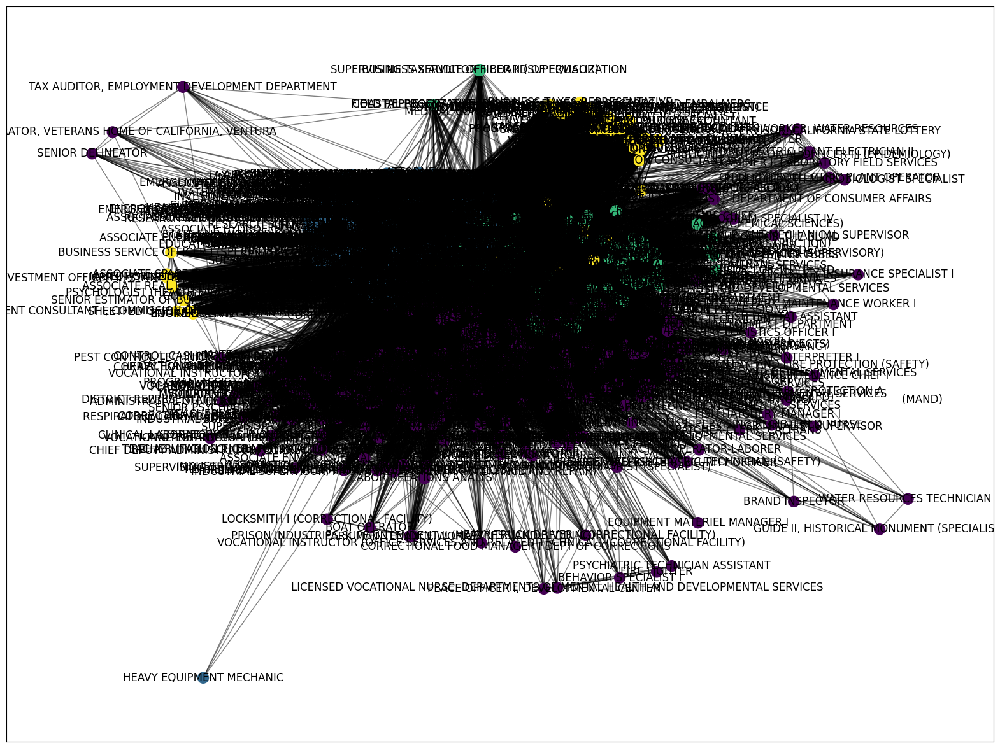

In [16]:
plt.figure(figsize=(20,15))

partition = community_louvain.best_partition(G)

pos=nx.spring_layout(G)

cmap=cm.get_cmap('viridis', max(partition.values())+1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=150,
                      cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos)

plt.show()

In [17]:
values=list(partition.values())
print('Số lượng cộng đồng Louvain: ', len(np.unique(values)))

Số lượng cộng đồng Louvain:  4


In [18]:
import networkx as nx
import matplotlib.pyplot as plt
import community
from collections import defaultdict

partition = community_louvain.best_partition(G)
# Create a dictionary to store the nodes in each cluster
clusters = defaultdict(list)
for node, cluster_id in partition.items():
    clusters[cluster_id].append(node)

# Print the list of clusters and their features
for cluster_id, nodes in clusters.items():
    print("Cluster:", cluster_id)
    print("Nodes:", nodes)
    subgraph = G.subgraph(nodes)
    print("Number of nodes:", len(subgraph))
    print("\n")

Cluster: 0
Nodes: ['CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY)', 'MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE', 'ACCOUNTANT I (SPECIALIST)', 'ASSOCIATE GOVERNMENTAL PROGRAM ANALYST', 'ASSOCIATE PERSONNEL ANALYST', 'AUTOMOBILE MECHANIC (CORRECTIONAL FACILITIES)', 'CALTRANS EQUIPMENT OPERATOR II', 'CALTRANS HIGHWAY MAINTENANCE LEADWORKER', 'CALTRANS HIGHWAY MAINTENANCE WORKER', 'CALTRANS LANDSCAPE MAINTENANCE LEADWORKER', 'CAPTAIN, ADULT INSTITUTION', 'CERTIFIED NURSING ASSISTANT', 'CHIEF PHYSICIAN AND SURGEON, CORRECTIONAL FACILITY', 'CHIEF PSYCHOLOGIST, CORRECTIONAL FACILITY', 'CONSERVATIONIST I', 'COOK SPECIALIST I', 'CUSTODIAN I', 'CUSTODIAN II', 'DENTAL ASSISTANT, CORRECTIONAL FACILITY', 'EMPLOYMENT PROGRAM REPRESENTATIVE', 'ENVIRONMENTAL SCIENTIST', 'FORESTRY TECHNICIAN', 'GROUNDSKEEPER', 'HEALTH PROGRAM MANAGER III', 'HEALTH RECORD TECHNICIAN I', 'HEALTH SERVICES SPECIALIST (SAFETY)', 'HEAVY EQUIPMENT MECHANIC (CORRECTIONAL FACILITY)', 'HEAVY EQUIPMENT MECHANIC APPREN

In [19]:
import pandas as pd
import networkx as nx

partition = community_louvain.best_partition(G)

df_original = pd.read_csv('CalCareersData_dropna.csv')

# Tạo đối tượng ExcelWriter để ghi vào file Excel
with pd.ExcelWriter('louvain_clusters_data_job.xlsx') as writer:
    for cluster_id, nodes in clusters.items():
        df_cluster = df_original[df_original['Job_Listing'].isin(nodes)]
        df_cluster['n_cluster'] = cluster_id
        df_cluster.to_excel(writer, sheet_name=f"Cluster {cluster_id}", index=False)

C:\Users\ducdu\AppData\Local\Temp\ipykernel_10212\1216303685.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster['n_cluster'] = cluster_id
C:\Users\ducdu\AppData\Local\Temp\ipykernel_10212\1216303685.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cluster['n_cluster'] = cluster_id
C:\Users\ducdu\AppData\Local\Temp\ipykernel_10212\1216303685.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

In [20]:
for i in range(len(np.unique(values))):
  print("Nhom", i+1, "*******************")
  for Group, k2 in partition.items():
    if k2 == i:
      print(Group)
  print("")

Nhom 1 *******************
CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FACILITY)
MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE
ACCOUNTANT I (SPECIALIST)
ASSOCIATE GOVERNMENTAL PROGRAM ANALYST
ASSOCIATE PERSONNEL ANALYST
AUTOMOBILE MECHANIC (CORRECTIONAL FACILITIES)
CALTRANS EQUIPMENT OPERATOR II
CALTRANS HIGHWAY MAINTENANCE LEADWORKER
CALTRANS HIGHWAY MAINTENANCE WORKER
CALTRANS LANDSCAPE MAINTENANCE LEADWORKER
CAPTAIN, ADULT INSTITUTION
CERTIFIED NURSING ASSISTANT
CHIEF PHYSICIAN AND SURGEON, CORRECTIONAL FACILITY
CHIEF PSYCHOLOGIST, CORRECTIONAL FACILITY
CONSERVATIONIST I
COOK SPECIALIST I
CUSTODIAN I
CUSTODIAN II
DENTAL ASSISTANT, CORRECTIONAL FACILITY
EMPLOYMENT PROGRAM REPRESENTATIVE
ENVIRONMENTAL SCIENTIST
FORESTRY TECHNICIAN
GROUNDSKEEPER
HEALTH PROGRAM MANAGER III
HEALTH RECORD TECHNICIAN I
HEALTH SERVICES SPECIALIST (SAFETY)
HEAVY EQUIPMENT MECHANIC (CORRECTIONAL FACILITY)
HEAVY EQUIPMENT MECHANIC APPRENTICE, CALTRANS
REGISTERED NURSE (SAFETY)
STAFF SERVICES ANALYST
STAFF SERV

# Thuật toán Spinglass

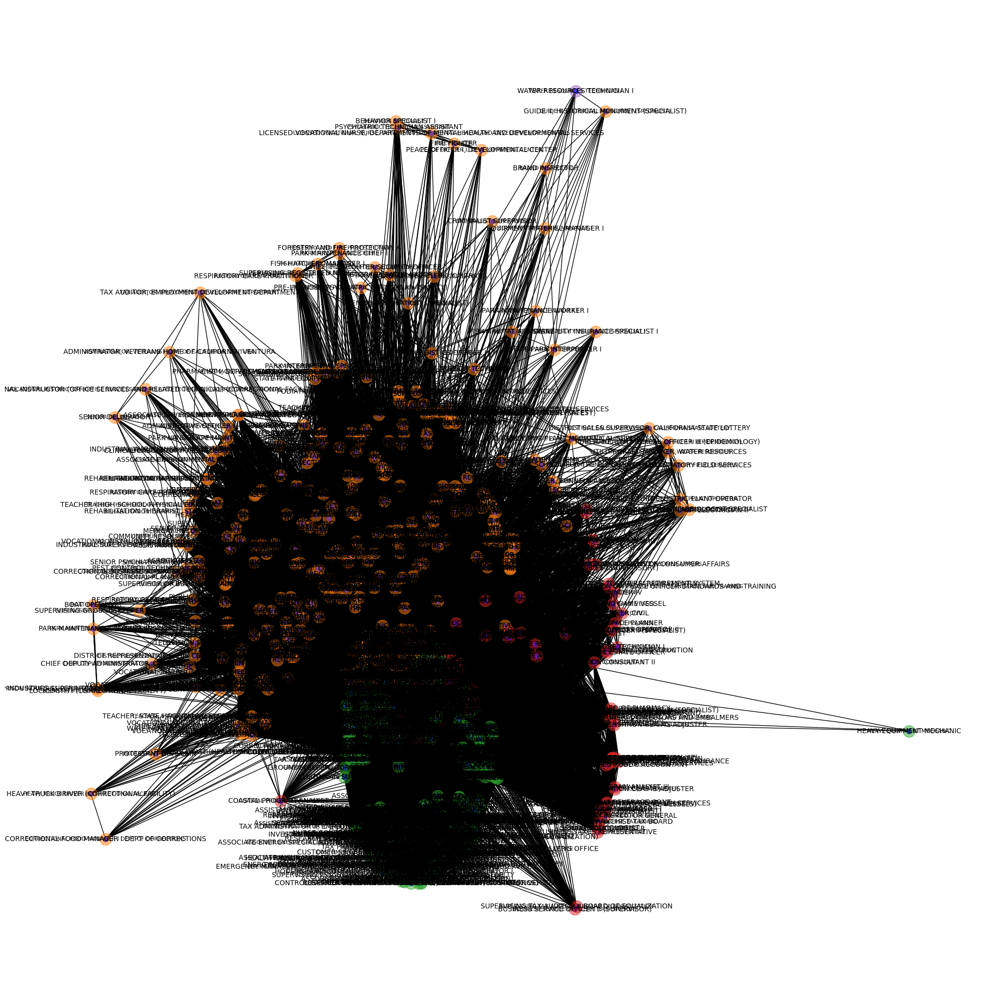

In [27]:
from cdlib import algorithms
from sklearn.datasets import make_classification
communitiesSG = algorithms.spinglass(G).communities

pos2 = nx.spring_layout(G)
plt.figure(figsize=(20,20))

nx.draw(G, pos2, with_labels=True, node_size=50,node_color='blue',font_size=8,font_color='black',width=1.0,edge_color='black')
for idx, community in enumerate(communitiesSG):
    nx.draw_networkx_nodes(G, pos2, nodelist=community, node_color=f'C{idx+1}', alpha=0.5)

# Add labels to the communities
for idx, community in enumerate(communitiesSG):
    nx.draw_networkx_labels(G, pos2, labels={node: node for node in community}, font_color='black', font_size=10)

plt.show()

In [28]:
# Xuất ra file excel
community_dfs = []

for idx, community in enumerate(communitiesSG):
    community_data = {'Node': community, 'Community': idx + 1}
    community_df = pd.DataFrame(community_data)
    community_dfs.append(community_df)

community_info = pd.concat(community_dfs, ignore_index=True)

# Save each community to a separate sheet in an Excel file
with pd.ExcelWriter('spinglass_cluster.xlsx') as writer:
    for idx, community_df in enumerate(community_dfs):
        community_df.to_excel(writer, sheet_name=f'Cluster_{idx + 1}', index=False)

# Thuật toán Agglomerative clustering

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly as py
import plotly.graph_objs as go

import warnings
warnings.filterwarnings('ignore')

from sklearn import preprocessing
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [25]:
df5 = pd.read_csv('CalCareersData.csv')
df5 = df5[['Job_Listing', 'Location']]
df5.reset_index(drop=True, inplace=True)
df5 = df5.dropna()
df5 = df5.drop_duplicates()
df5

,Job_Listing,Location
0,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...,Solano County
1,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,Riverside County
2,ACCOUNTANT I (SPECIALIST),Marin County
3,ACCOUNTING ADMINISTRATOR I (SUPERVISOR),Yolo County
4,ACCOUNTING OFFICER (SPECIALIST),San Francisco County
...,...,...
5752,AGRICULTURAL TECHNICIAN I (SEASONAL),Lassen County
5754,AGRICULTURAL TECHNICIAN I (SEASONAL),El Dorado County
5756,AGRICULTURAL TECHNICIAN I (SEASONAL),Del Norte County
5763,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK...",Santa Clara County


In [26]:
label_encoder = preprocessing.LabelEncoder()
df5['Job_Listing_name'] = label_encoder.fit_transform(df5['Job_Listing'])
df5['Location_name'] = label_encoder.fit_transform(df5['Location'])
df5

,Job_Listing,Location,Job_Listing_name,Location_name
0,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...,Solano County,212,46
1,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,Riverside County,443,32
2,ACCOUNTANT I (SPECIALIST),Marin County,1,20
3,ACCOUNTING ADMINISTRATOR I (SUPERVISOR),Yolo County,4,56
4,ACCOUNTING OFFICER (SPECIALIST),San Francisco County,7,37
...,...,...,...,...
5752,AGRICULTURAL TECHNICIAN I (SEASONAL),Lassen County,24,17
5754,AGRICULTURAL TECHNICIAN I (SEASONAL),El Dorado County,24,8
5756,AGRICULTURAL TECHNICIAN I (SEASONAL),Del Norte County,24,7
5763,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK...",Santa Clara County,255,42


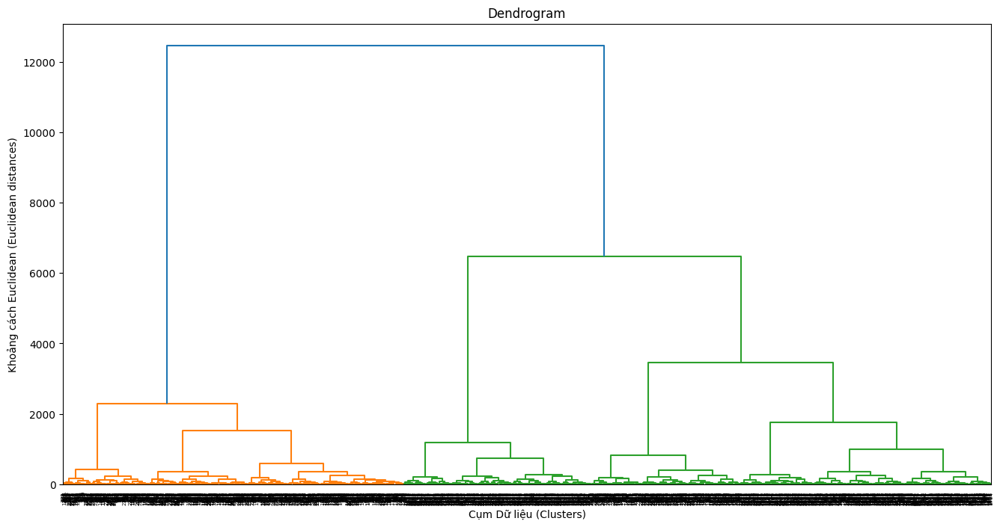

In [27]:
plt.figure(1, figsize = (16 ,8))
dendrogram = sch.dendrogram(sch.linkage(df5[['Job_Listing_name', 'Location_name']], method  = "ward"))

plt.title('Dendrogram')
plt.xlabel('Cụm Dữ liệu (Clusters)')
plt.ylabel('Khoảng cách Euclidean (Euclidean distances)')
plt.show()

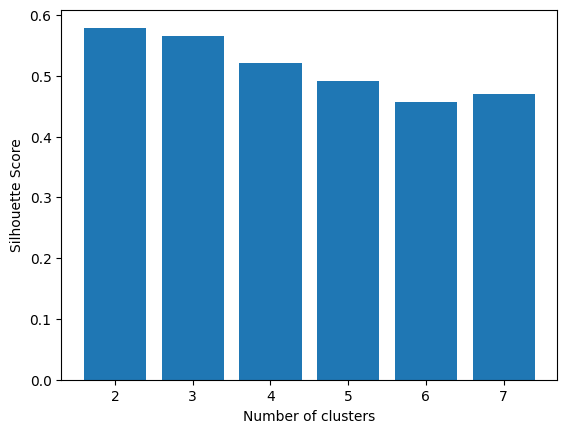

In [28]:
from sklearn.metrics import silhouette_score
silhouette_scores = []

for n_cluster in range(2, 8):
    silhouette_scores.append(
        silhouette_score(df5[['Job_Listing_name', 'Location_name']], AgglomerativeClustering(n_clusters = n_cluster).fit_predict(df5[['Job_Listing_name', 'Location_name']])))

# Plotting a bar graph to compare the results
k = [2, 3, 4, 5, 6,7]
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhouette Score', fontsize = 10)
plt.show()

In [29]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
cluster.fit_predict(df5[['Job_Listing_name', 'Location_name']])

array([1, 0, 1, ..., 1, 1, 0], dtype=int64)

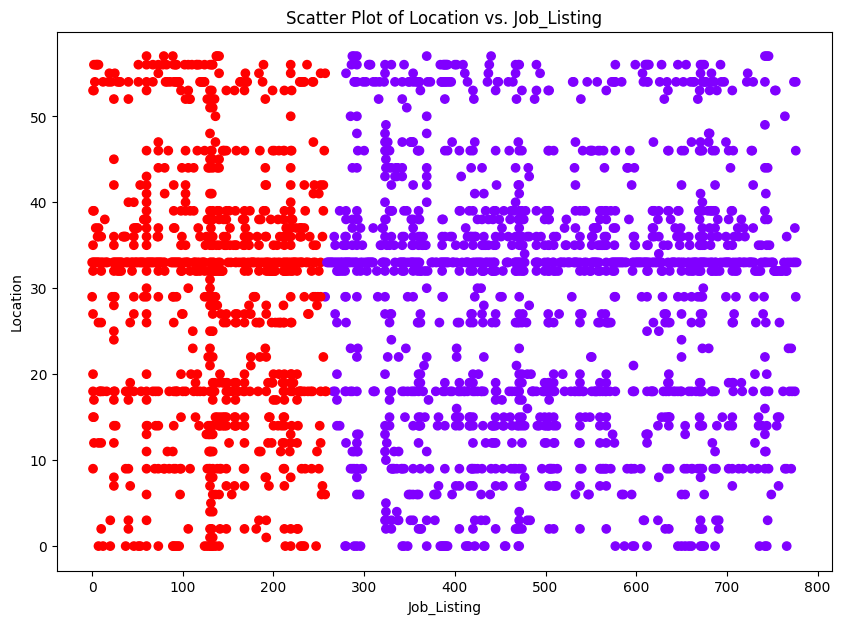

In [30]:
plt.figure(figsize=(10, 7))
plt.scatter(df5['Job_Listing_name'], df5['Location_name'], c=cluster.labels_, cmap='rainbow')
plt.xlabel('Job_Listing')
plt.ylabel('Location')
plt.title('Scatter Plot of Location vs. Job_Listing')
plt.show()

In [31]:
optimal_n_clusters = 2
cluster = AgglomerativeClustering(n_clusters=optimal_n_clusters, affinity='euclidean', linkage='ward')
cluster_labels = cluster.fit_predict(df5[['Job_Listing_name', 'Location_name']])

df5['Cluster'] = cluster_labels

excel_file_name = 'Agglomerative_cluster_job.xlsx'
with pd.ExcelWriter(excel_file_name, engine='xlsxwriter') as writer:
    # Export data for each cluster to a separate sheet
    for cluster_label in range(optimal_n_clusters):
        cluster_df = df5[df5['Cluster'] == cluster_label]
        sheet_name = f'Cluster_{cluster_label + 1}'
        cluster_df.to_excel(writer, sheet_name=sheet_name, index=False, header=True)
        print(f'Data for Cluster {cluster_label + 1} exported to sheet "{sheet_name}" in {excel_file_name}')

Data for Cluster 1 exported to sheet "hierarchical_cluster_1" in hierarchical_cluster_job.xlsx
Data for Cluster 2 exported to sheet "hierarchical_cluster_2" in hierarchical_cluster_job.xlsx


# Thuật toán Spectral Clustering

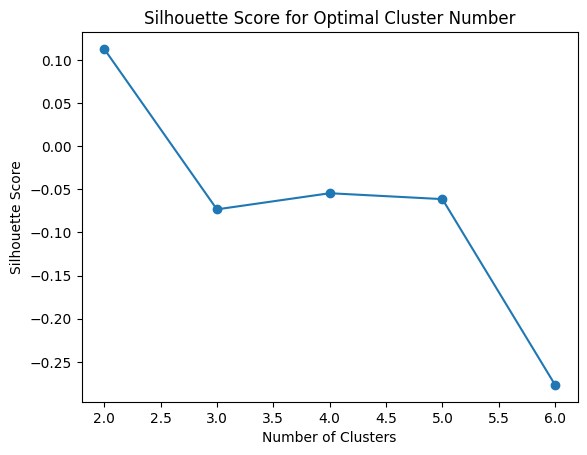

In [32]:
import pandas as pd
import numpy as np
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score

df5 = pd.read_csv('CalCareersData_dropna.csv')
df5 = df5[['Job_Listing', 'Location']]

job_listings = df5['Job_Listing'].values.astype('U')
locations = df5['Location'].values.astype('U')

label_encoder = LabelEncoder()
locations_encoded = label_encoder.fit_transform(locations)

X = np.column_stack((locations_encoded, np.ones_like(locations_encoded)))

# Thử nghiệm số lượng cụm từ 2 đến 7
n_clusters_range = range(2, 7)
silhouette_scores = []

for n_clusters in n_clusters_range:
    # Thực hiện Spectral Clustering
    spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
    labels = spectral.fit_predict(X)
    
    # Đo silhouette score
    silhouette_scores.append(silhouette_score(X, labels))

# Vẽ đồ thị Silhouette để xác định số lượng cụm tốt nhất
plt.plot(n_clusters_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal Cluster Number')
plt.show()

In [34]:
# Thực hiện Spectral Clustering với số lượng cụm xác định
n_clusters = 4
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels = spectral.fit_predict(X)

df5['Cluster'] = labels

# Tạo một ExcelWriter để xuất kết quả ra file Excel
with pd.ExcelWriter('spectral_clustering.xlsx', engine='xlsxwriter') as writer:
    for cluster_id in range(n_clusters):
        cluster_data = df5[df5['Cluster'] == cluster_id].drop('Cluster', axis=1)

        # Xuất dữ liệu vào một sheet trong Excel
        sheet_name = f'Cluster_{cluster_id + 1}'
        cluster_data.to_excel(writer, sheet_name=sheet_name, index=False)

# Thuật toán Random Forest

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn import metrics
import time
import seaborn as sns
from sklearn import preprocessing
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import classification_report

In [14]:
df5 = pd.read_csv('CalCareersData.csv')
df5 = df5[['Job_Listing', 'Location']]
df5.reset_index(drop=True, inplace=True)
df5 = df5.dropna()
df5 = df5.drop_duplicates()
df5

,Job_Listing,Location
0,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...,Solano County
1,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,Riverside County
2,ACCOUNTANT I (SPECIALIST),Marin County
3,ACCOUNTING ADMINISTRATOR I (SUPERVISOR),Yolo County
4,ACCOUNTING OFFICER (SPECIALIST),San Francisco County
...,...,...
5752,AGRICULTURAL TECHNICIAN I (SEASONAL),Lassen County
5754,AGRICULTURAL TECHNICIAN I (SEASONAL),El Dorado County
5756,AGRICULTURAL TECHNICIAN I (SEASONAL),Del Norte County
5763,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK...",Santa Clara County


In [15]:
label_encoder = preprocessing.LabelEncoder()
df5['Job_Listing_name'] = label_encoder.fit_transform(df5['Job_Listing'])
df5['Location_name'] = label_encoder.fit_transform(df5['Location'])
df5

,Job_Listing,Location,Job_Listing_name,Location_name
0,CORRECTIONAL SUPERVISING COOK (CORRECTIONAL FA...,Solano County,212,46
1,MECHANICAL AND TECHNICAL OCCUPATIONAL TRAINEE,Riverside County,443,32
2,ACCOUNTANT I (SPECIALIST),Marin County,1,20
3,ACCOUNTING ADMINISTRATOR I (SUPERVISOR),Yolo County,4,56
4,ACCOUNTING OFFICER (SPECIALIST),San Francisco County,7,37
...,...,...,...,...
5752,AGRICULTURAL TECHNICIAN I (SEASONAL),Lassen County,24,17
5754,AGRICULTURAL TECHNICIAN I (SEASONAL),El Dorado County,24,8
5756,AGRICULTURAL TECHNICIAN I (SEASONAL),Del Norte County,24,7
5763,"DISTRICT SUPERINTENDENT II, DEPARTMENT OF PARK...",Santa Clara County,255,42


In [16]:
df_rf = df5[['Job_Listing_name','Location_name']]
features = df_rf.drop('Location_name', axis=1)
labels = df_rf['Location_name']
# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=42)

rf = RandomForestClassifier()
start_time_rf = time.time()
# Train Random Forest classifer
rf.fit(X_train, y_train)
train_time_rf = time.time() - start_time_rf

#Predict the response for dataset
y_pred = rf.predict(X_test)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Accuracy_score
accuracy_rf = accuracy_score(y_test, y_pred)
print("Accuracy_rf:", accuracy_rf)

Accuracy_rf: 0.05042016806722689


In [17]:
#Model Accuracy
train_accuracy_rf = accuracy_score(y_train, y_train_pred)
test_accuracy_rf = accuracy_score(y_test, y_test_pred)
print("Training Time:", train_time_rf)
print("Training Accuracy:", train_accuracy_rf)
print("Test Accuracy:", test_accuracy_rf)
print("Report: ",classification_report(y_test, y_pred))

Training Time: 0.6822760105133057
Training Accuracy: 0.39002403846153844
Test Accuracy: 0.05042016806722689
Report:                precision    recall  f1-score   support

           0       0.00      0.00      0.00        17
           1       0.00      0.00      0.00         1
           2       0.17      0.08      0.11        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         2
           6       0.00      0.00      0.00        12
           7       0.00      0.00      0.00         6
           8       0.00      0.00      0.00         3
           9       0.00      0.00      0.00        34
          11       0.00      0.00      0.00        10
          12       0.00      0.00      0.00         9
          13       0.00      0.00      0.00         8
          14       0.00      0.00      0.00        20
          15       0.00      0.00      0.00        14
          16       0.00      0.00      0.00         2
          17      

c:\Users\ducdu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ducdu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ducdu\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifie

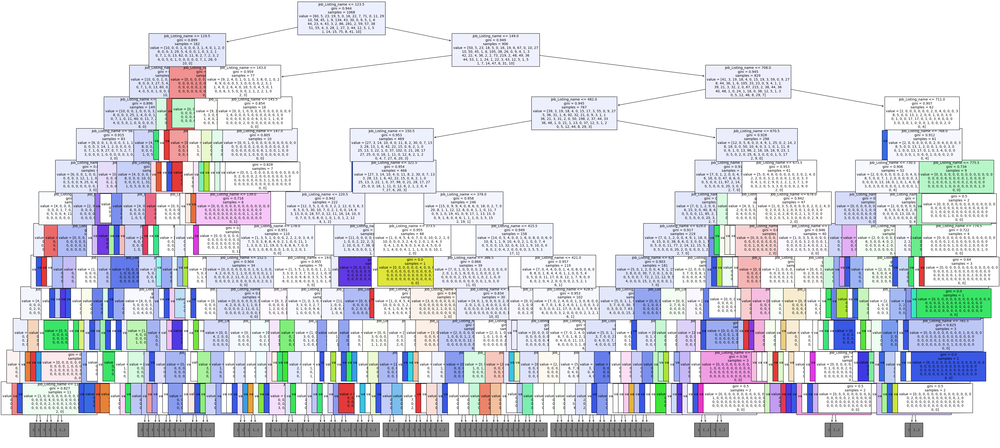

In [18]:
plt.figure(figsize=(50,24))
plot_tree(rf.estimators_[0], max_depth=12, feature_names=features.columns, filled=True, fontsize=10)
plt.show()

In [41]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from openpyxl import Workbook
from openpyxl.utils.dataframe import dataframe_to_rows
import re

df = pd.read_csv('CalCareersData_dropna.csv', usecols=['Location', 'Job_Listing'])

label_encoder = LabelEncoder()
df['Job_Listing_encoded'] = label_encoder.fit_transform(df['Job_Listing'])
df['Location_encoded'] = label_encoder.fit_transform(df['Location'])

# Chia dữ liệu thành features và target
X = df.drop(['Job_Listing', 'Location'], axis=1)
y = df['Location']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Xây dựng mô hình Random Forest
rf = RandomForestClassifier()

# Huấn luyện mô hình trên tập huấn luyện
rf.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred = rf.predict(X_test)

df.reset_index(drop=True, inplace=True)

df['cluster_name'] = rf.predict(X)

df['cluster'] = label_encoder.fit_transform(df['cluster_name']) + 1
df.drop('cluster_name', axis=1, inplace=True)

workbook = Workbook()
writer = pd.ExcelWriter('RandomForest_results.xlsx')

# Ghi dữ liệu từng cụm ra từng sheet của file Excel
for cluster_value in set(df['cluster']):
    cluster_data = df[df['cluster'] == cluster_value]
    sheet_name = f'Cluster_{cluster_value}'
    cluster_data.to_excel(writer, sheet_name=sheet_name, index=False)

# Lưu file Excel
writer.close()

# Thuật toán Decision Tree

In [42]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier

In [43]:
clf = DecisionTreeClassifier(criterion="gini", random_state=0)

clf.fit(X_train, y_train)

train_pred = clf.predict(X_train)
test_pred = clf.predict(X_test)

train_accuracy = metrics.accuracy_score(y_train, train_pred)
test_accuracy = metrics.accuracy_score(y_test, test_pred)

print("Accuracy on training set:", train_accuracy)
print("Accuracy on test set:", test_accuracy)
print("Report:", metrics.classification_report(y_test, test_pred))

Accuracy on training set: 1.0
Accuracy on test set: 0.9985994397759104
Report:                         precision    recall  f1-score   support

        Alameda County       1.00      1.00      1.00        17
         Alpine County       1.00      1.00      1.00         1
         Amador County       1.00      1.00      1.00        12
          Butte County       1.00      1.00      1.00         9
      Calaveras County       1.00      1.00      1.00         2
   Contra Costa County       1.00      1.00      1.00        12
      Del Norte County       1.00      1.00      1.00         6
      El Dorado County       1.00      1.00      1.00         3
         Fresno County       1.00      1.00      1.00        34
       Humboldt County       1.00      1.00      1.00        10
       Imperial County       1.00      1.00      1.00         9
           Inyo County       1.00      1.00      1.00         8
           Kern County       1.00      1.00      1.00        20
          Kings County  

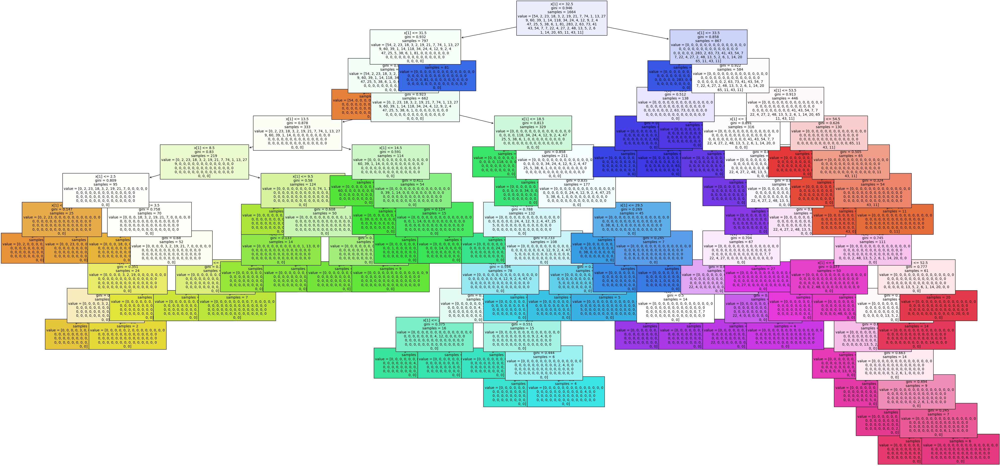

In [44]:
fig, ax = plt.subplots(figsize=(50,24))
plot_tree(clf, filled=True, fontsize=10)
plt.savefig('decision_tree_gini',dpi=100)
plt.show()

In [45]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

df = pd.read_csv('CalCareersData_dropna.csv', usecols=['Location', 'Job_Listing'])

df_encoded = pd.get_dummies(df, columns=['Job_Listing'])

clf = DecisionTreeClassifier()

# Chọn các cột đầu vào và cột đầu ra
X = df_encoded.drop('Location', axis=1)
y = df_encoded['Location']

# Huấn luyện mô hình Decision Tree
clf.fit(X, y)

df['cluster_name'] = clf.predict(X)

df['cluster'] = label_encoder.fit_transform(df['cluster_name']) + 1
df.drop('cluster_name', axis=1, inplace=True)

# Tạo một workbook mới
workbook = Workbook()

# Tạo một ExcelWriter để ghi dữ liệu ra từng sheet
writer = pd.ExcelWriter('Decision_Tree.xlsx')

# Ghi dữ liệu từng cụm ra từng sheet của file Excel
for cluster_value in set(df['cluster']):
    cluster_data = df[df['cluster'] == cluster_value]
    sheet_name = f'Cluster_{cluster_value}'
    cluster_data.to_excel(writer, sheet_name=sheet_name, index=False)

writer.close()